In [6]:
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams['font.family'] ='Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False
import glob

In [7]:
test_files = glob.glob("../dataset/test/TEST_*.csv")
test_list = []

for f in test_files:
    df_test = pd.read_csv(f)
    df_test['영업일자'] = pd.to_datetime(df_test['영업일자'])
    df_test['매출수량'] = df_test['매출수량'].clip(lower=0)
    
    # 각 메뉴별 마지막 날짜 이후 7일간 데이터 생성
    new_rows = []
    for menu in df_test['영업장명_메뉴명'].unique():
        menu_df = df_test[df_test['영업장명_메뉴명'] == menu].copy()
        last_date = menu_df['영업일자'].max()
        
        # 1일부터 7일까지 날짜 생성
        for i in range(1, 8):
            new_date = last_date + pd.Timedelta(days=i)
            new_rows.append({
                '영업일자': new_date,
                '영업장명_메뉴명': menu,
                '매출수량': -10
            })
        
    # 기존 데이터 + 새로 생성한 데이터 합치기
    df_test = pd.concat([df_test, pd.DataFrame(new_rows)], ignore_index=True)
    test_list.append(df_test)

# 모든 test 파일 합치기
test_all = pd.concat(test_list, ignore_index=True)


In [8]:
train = pd.read_csv("../dataset/train/train.csv")  # train 데이터 불러오기
train['매출수량'] = train['매출수량'].clip(lower=0)

# 날짜 컬럼 형식 변환
train['영업일자'] = pd.to_datetime(train['영업일자'])
test_all['영업일자'] = pd.to_datetime(test_all['영업일자'])

# train + test 합치기
full_data = pd.concat([train, test_all], ignore_index=True)

### 담하(42)

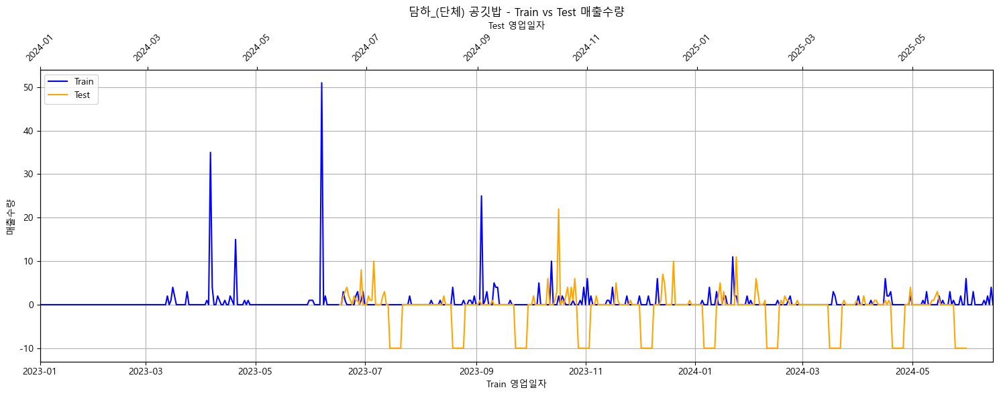

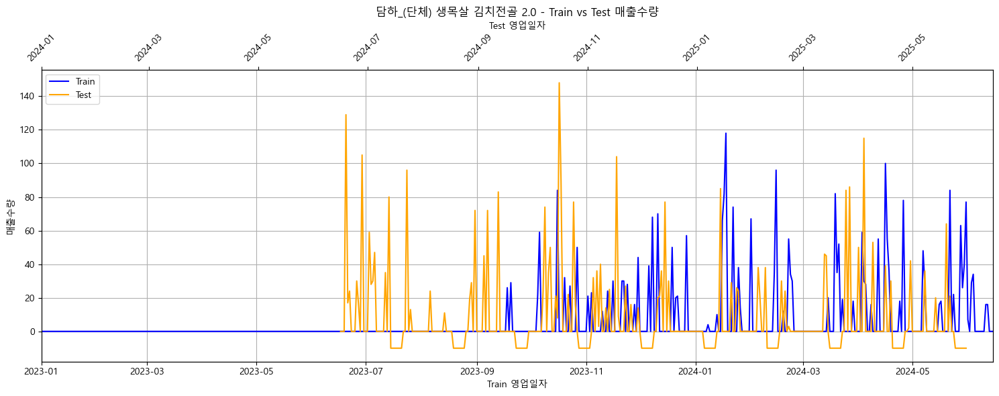

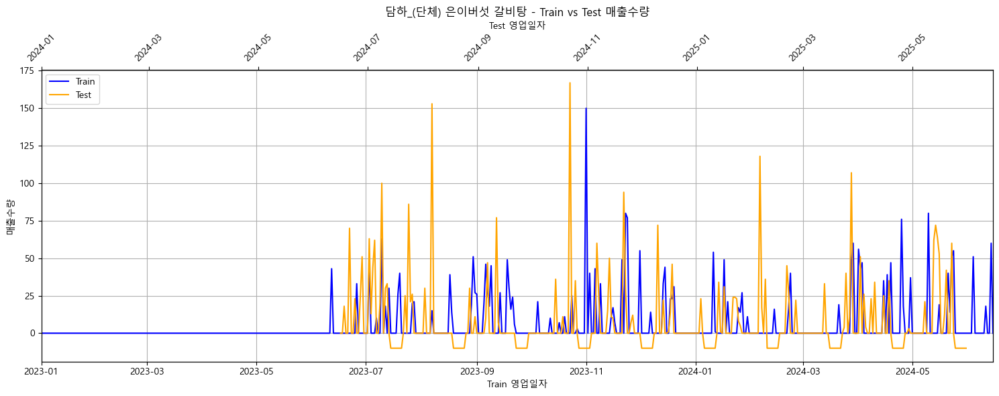

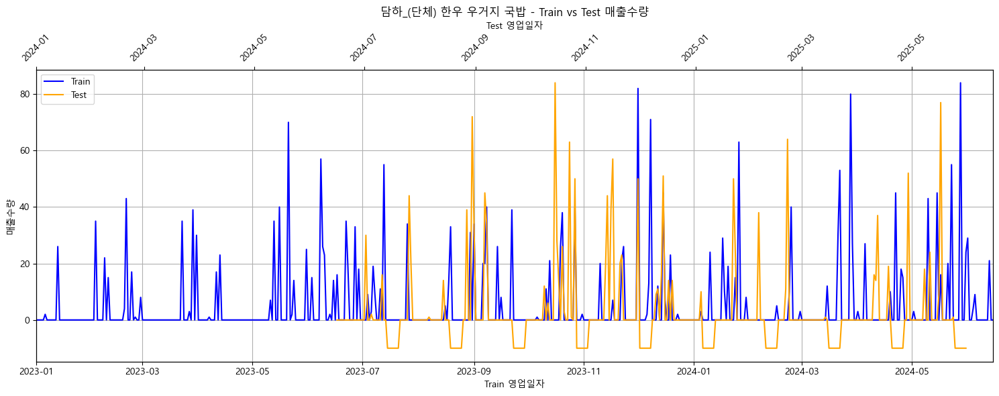

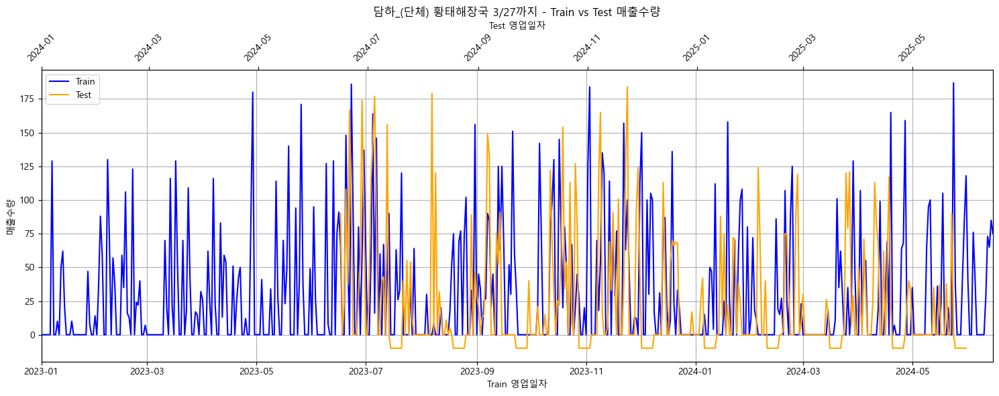

...

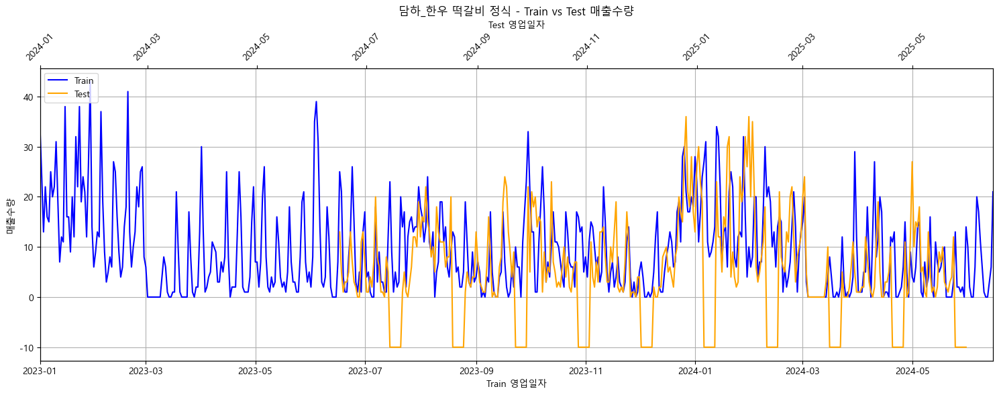

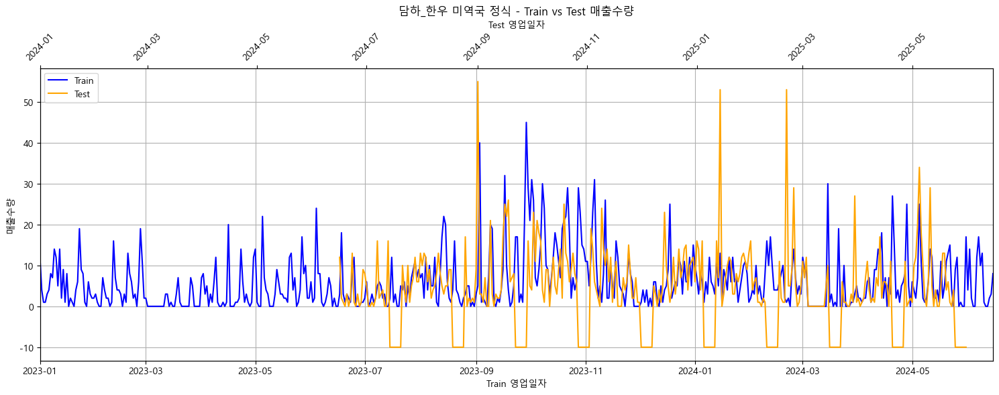

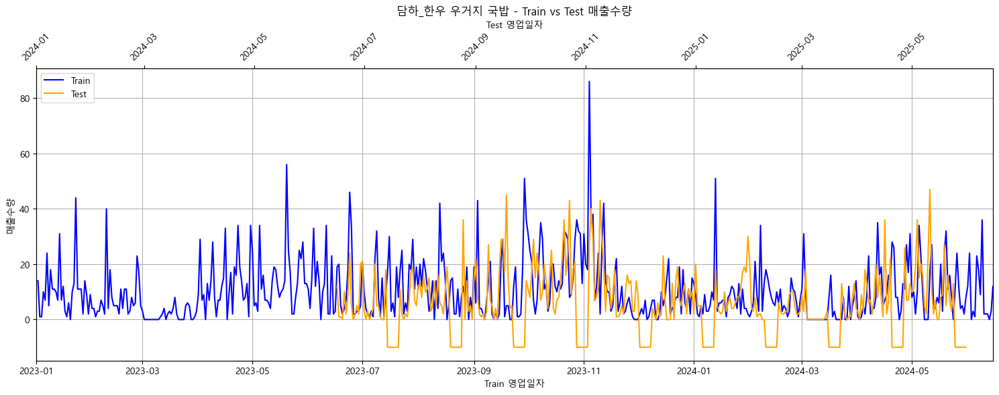

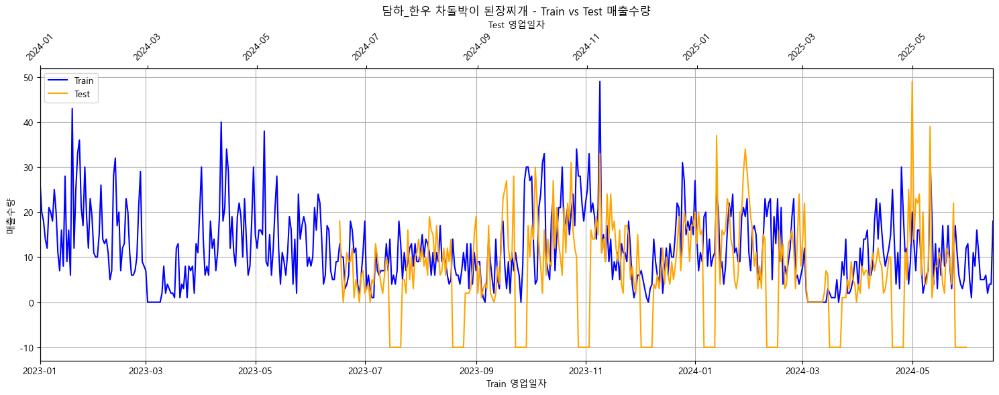

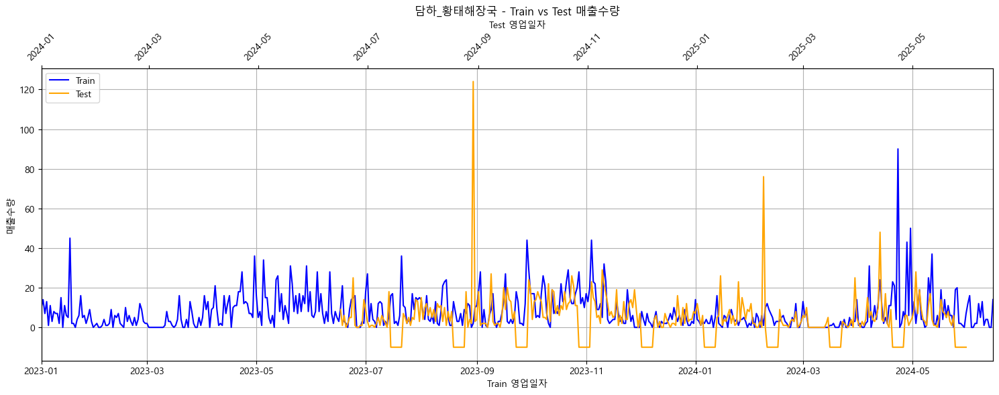

In [9]:
df_dh = train[train['영업장명_메뉴명'].str.contains('담하')]['영업장명_메뉴명'].unique()

for menu_name in df_dh: 
    train_plot = train[train['영업장명_메뉴명'] == menu_name].copy()
    test_plot = test_all[test_all['영업장명_메뉴명'] == menu_name].copy()

    fig, ax_train = plt.subplots(figsize=(15,6))
    
    # ===== Train 라인 =====
    ax_train.plot(train_plot['영업일자'], train_plot['매출수량'], color='blue', label='Train')
    ax_train.set_xlabel("Train 영업일자")
    ax_train.set_ylabel("매출수량")
    ax_train.set_xlim(train_plot['영업일자'].min(), train_plot['영업일자'].max())
    ax_train.grid(True)
    
    # Train 기준 세로선 (선택)
    #ax_train.axvline(pd.Timestamp("2023-07-01"), color='blue', linestyle='--', alpha=0.5)
    
    # ===== Test 라인 (위쪽 x축 사용) =====
    ax_test = ax_train.twiny()  # 위쪽 x축 공유 y축
    ax_test.plot(test_plot['영업일자'], test_plot['매출수량'], color='orange', label='Test')
    ax_test.set_xlim(pd.Timestamp("2024-01-01"), pd.Timestamp("2025-06-15"))  # test x축 범위
    ax_test.set_xlabel("Test 영업일자")
    
    # Test 기준 세로선 (선택)
    #ax_test.axvline(pd.Timestamp("2024-07-01"), color='orange', linestyle='--', alpha=0.5)
    
    # 범례 합치기
    lines, labels = ax_train.get_legend_handles_labels()
    lines2, labels2 = ax_test.get_legend_handles_labels()
    ax_train.legend(lines + lines2, labels + labels2, loc='upper left')
    
    plt.title(f"{menu_name} - Train vs Test 매출수량")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

### 미라시아(31)

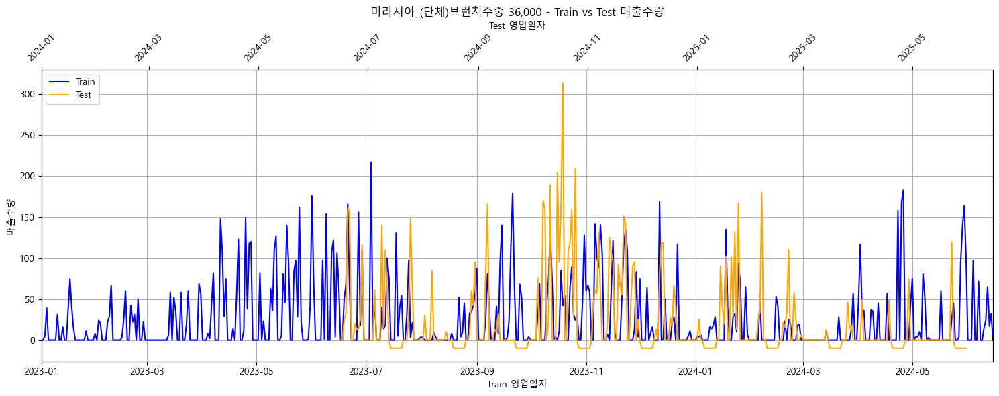

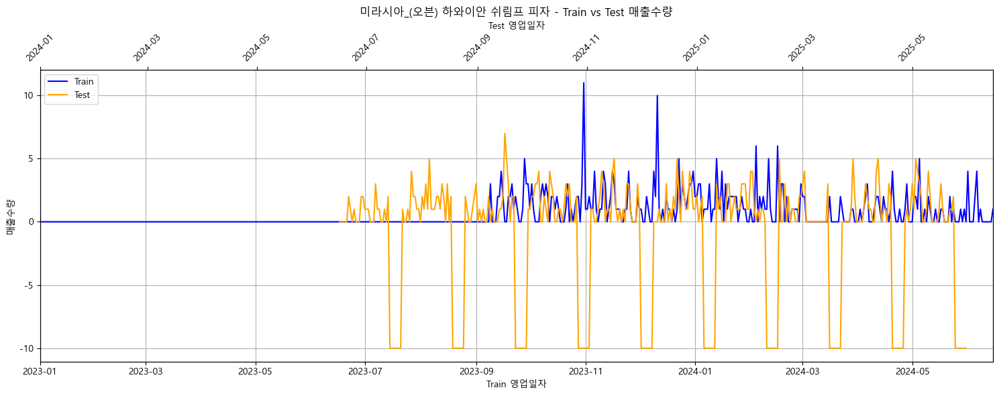

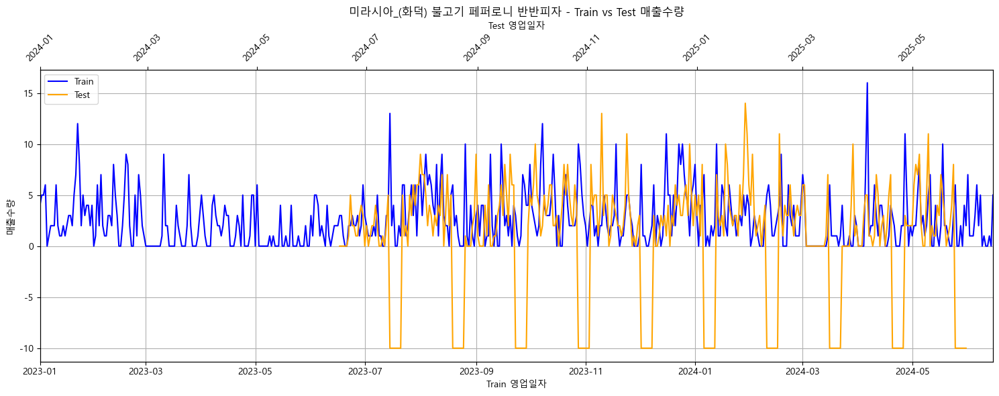

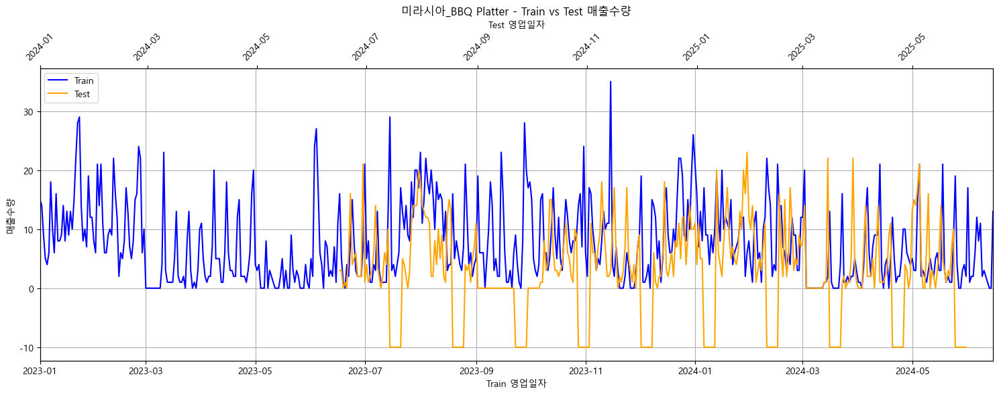

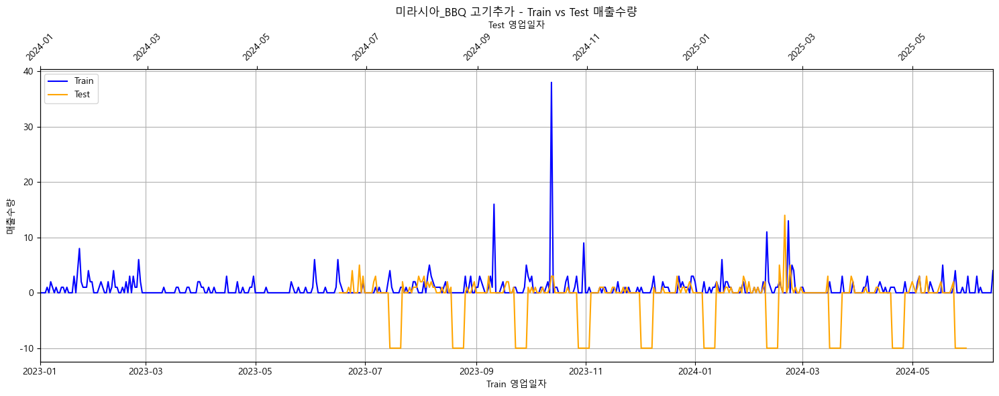

...

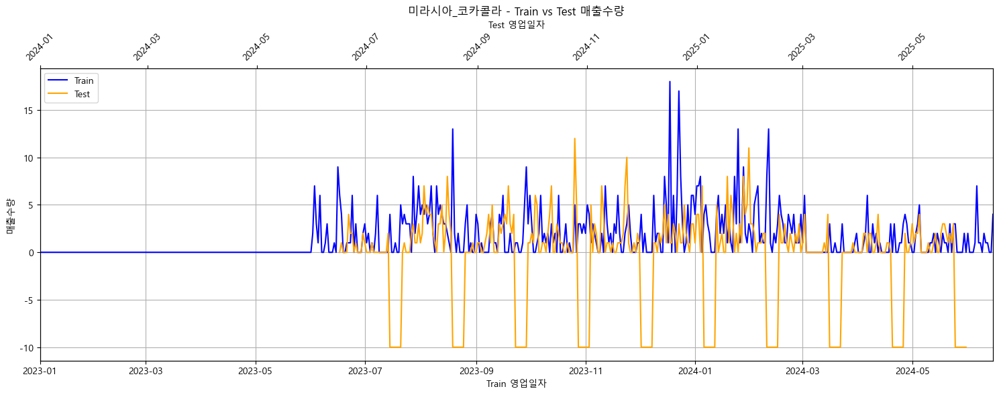

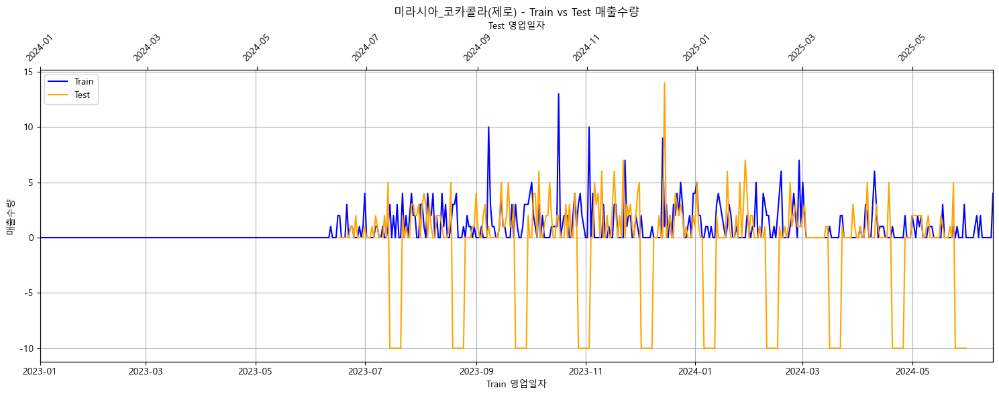

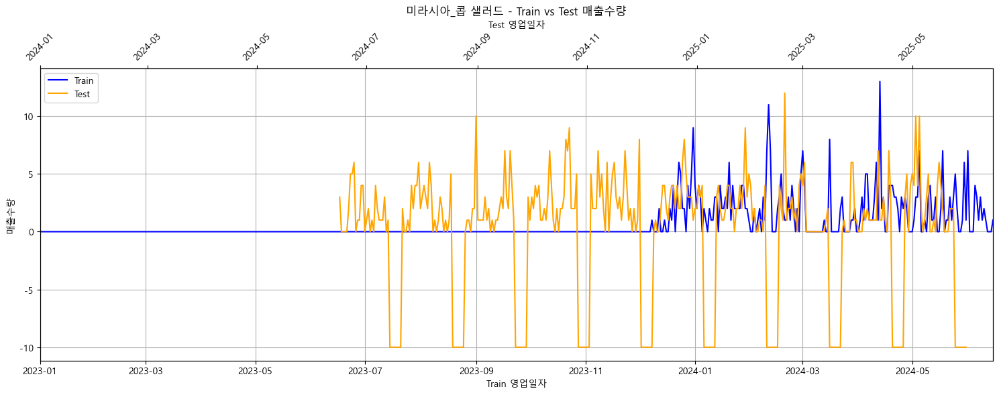

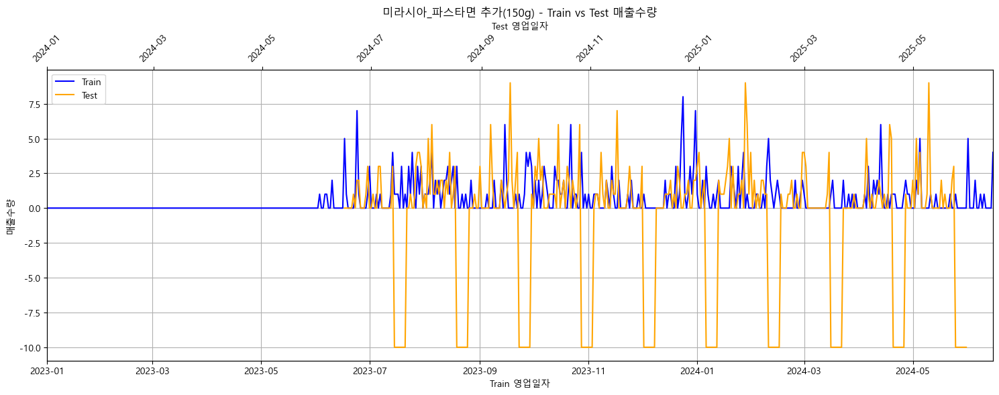

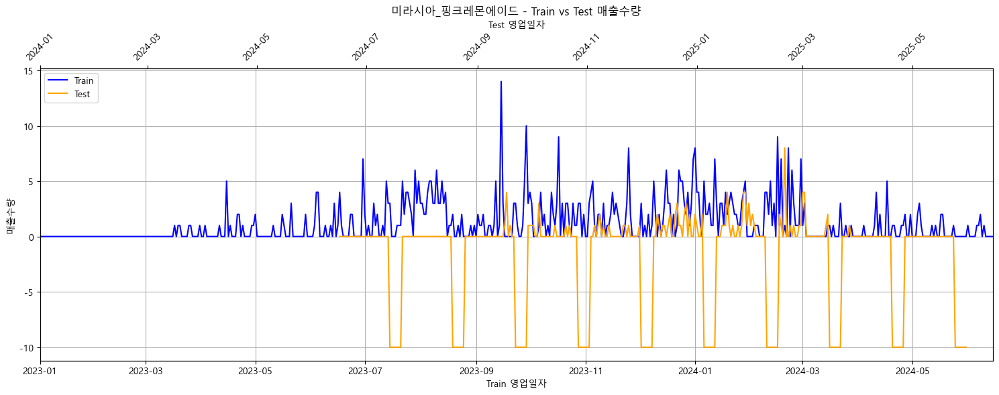

In [10]:
df_mrsa = train[train['영업장명_메뉴명'].str.contains('미라시아')]['영업장명_메뉴명'].unique()

for menu_name in df_mrsa: 
    train_plot = train[train['영업장명_메뉴명'] == menu_name].copy()
    test_plot = test_all[test_all['영업장명_메뉴명'] == menu_name].copy()

    fig, ax_train = plt.subplots(figsize=(15,6))
    
    # ===== Train 라인 =====
    ax_train.plot(train_plot['영업일자'], train_plot['매출수량'], color='blue', label='Train')
    ax_train.set_xlabel("Train 영업일자")
    ax_train.set_ylabel("매출수량")
    ax_train.set_xlim(train_plot['영업일자'].min(), train_plot['영업일자'].max())
    ax_train.grid(True)
    
    # Train 기준 세로선 (선택)
    #ax_train.axvline(pd.Timestamp("2023-07-01"), color='blue', linestyle='--', alpha=0.5)
    
    # ===== Test 라인 (위쪽 x축 사용) =====
    ax_test = ax_train.twiny()  # 위쪽 x축 공유 y축
    ax_test.plot(test_plot['영업일자'], test_plot['매출수량'], color='orange', label='Test')
    ax_test.set_xlim(pd.Timestamp("2024-01-01"), pd.Timestamp("2025-06-15"))  # test x축 범위
    ax_test.set_xlabel("Test 영업일자")
    
    # Test 기준 세로선 (선택)
    #ax_test.axvline(pd.Timestamp("2024-07-01"), color='orange', linestyle='--', alpha=0.5)
    
    # 범례 합치기
    lines, labels = ax_train.get_legend_handles_labels()
    lines2, labels2 = ax_test.get_legend_handles_labels()
    ax_train.legend(lines + lines2, labels + labels2, loc='upper left')
    
    plt.title(f"{menu_name} - Train vs Test 매출수량")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()